In [1]:
!pip install patchify

In [49]:
import numpy as np
from matplotlib import pyplot as plt
from patchify import patchify
from PIL import Image
import requests
import shutil
import random
import os
import zipfile
import cv2
import torch
import torchvision
import torch.nn as nn
import albumentations as A
import torch.optim as optim
from torchvision import models
import torch.nn.functional as F
from torch.optim import lr_scheduler
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader, Dataset

In [3]:
os.makedirs('datasets', exist_ok=True)
%cd datasets

/content/datasets


In [4]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)

download_file(
    'https://drive.google.com/uc?export=download&confirm=no_antivirus&id=1eC5Zd4kbwZrK4jgOjAjLMNzJk72_tSBP',
    'dataset.zip'
)

In [5]:
def unzip_file(zip_file=None):
  try:
    with zipfile.ZipFile(zip_file) as zip:
      zip.extractall("./")
      print("Extract all")
  except:
     print("Extract with error")

unzip_file('/content/datasets/dataset.zip')

Extract all


In [6]:
train_folder = "/content/datasets/train/images"
folder_path = "/content/datasets/train/masks"

In [7]:
old_name = os.path.join(folder_path, 'train_mask_012.png')
new_name = os.path.join(folder_path, 'train_mask_012_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_013.png')
new_name = os.path.join(folder_path, 'train_mask_013_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_014.png')
new_name = os.path.join(folder_path, 'train_mask_014_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_015.png')
new_name = os.path.join(folder_path, 'train_mask_015_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_016.png')
new_name = os.path.join(folder_path, 'train_mask_016_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_017.png')
new_name = os.path.join(folder_path, 'train_mask_017_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_018.png')
new_name = os.path.join(folder_path, 'train_mask_018_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_019.png')
new_name = os.path.join(folder_path, 'train_mask_019_сopy.png')
shutil.copy(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_012.png')
new_name = os.path.join(folder_path, 'train_mask_013_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_013.png')
new_name = os.path.join(folder_path, 'train_mask_014_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_014.png')
new_name = os.path.join(folder_path, 'train_mask_015_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_015.png')
new_name = os.path.join(folder_path, 'train_mask_016_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_016.png')
new_name = os.path.join(folder_path, 'train_mask_017_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_017.png')
new_name = os.path.join(folder_path, 'train_mask_018_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_018.png')
new_name = os.path.join(folder_path, 'train_mask_019_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_019.png')
new_name = os.path.join(folder_path, 'train_mask_012_сopy.png')
os.rename(old_name, new_name)
old_name = os.path.join(folder_path, 'train_mask_012.png')
new_name = os.path.join(folder_path, 'train_mask_012_сopy.png')
os.rename(new_name, old_name)
old_name = os.path.join(folder_path, 'train_mask_013.png')
new_name = os.path.join(folder_path, 'train_mask_013_сopy.png')
os.rename(new_name, old_name)
old_name = os.path.join(folder_path, 'train_mask_014.png')
new_name = os.path.join(folder_path, 'train_mask_014_сopy.png')
os.rename(new_name, old_name)
old_name = os.path.join(folder_path, 'train_mask_015.png')
new_name = os.path.join(folder_path, 'train_mask_015_сopy.png')
os.rename(new_name, old_name)
old_name = os.path.join(folder_path, 'train_mask_016.png')
new_name = os.path.join(folder_path, 'train_mask_016_сopy.png')
os.rename(new_name, old_name)
old_name = os.path.join(folder_path, 'train_mask_017.png')
new_name = os.path.join(folder_path, 'train_mask_017_сopy.png')
os.rename(new_name, old_name)
old_name = os.path.join(folder_path, 'train_mask_018.png')
new_name = os.path.join(folder_path, 'train_mask_018_сopy.png')
os.rename(new_name, old_name)
old_name = os.path.join(folder_path, 'train_mask_019.png')
new_name = os.path.join(folder_path, 'train_mask_019_сopy.png')
os.rename(new_name, old_name)

In [8]:
%cd ..

/content


In [9]:
os.makedirs('PatchDataset', exist_ok=True)
%cd PatchDataset

/content/PatchDataset


In [10]:
os.makedirs('images', exist_ok=True)


In [11]:
%cd images

/content/PatchDataset/images


In [12]:
print(len(os.listdir(train_folder)))
for filename in os.listdir(train_folder):
    if filename.endswith(".png"):
      large_image_stack = np.array(Image.open(train_folder + "/" + filename))
      patches_img = patchify(large_image_stack, (304, 304, 3), step=304)

      for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = np.squeeze(patches_img[i,j,:,:],  axis=0)
            im = Image.fromarray(single_patch_img)
            im.save("/content/PatchDataset/images/" + filename + '_' + str(i)+str(j)+ ".png")
print(len(os.listdir("/content/PatchDataset/images/")))

22


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (99969780 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (108245178 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


8341


In [80]:
large_image_stack.shape

(6394, 7920)

/content/PatchDataset
/content/PatchDataset/masks


In [14]:

for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
      large_mask_stack = np.array(Image.open(folder_path + "/" + filename))
      patches_mask = patchify(large_mask_stack, (304, 304), step=304)

      for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = (patches_mask[i,j,:,:])
            im = Image.fromarray(single_patch_mask)
            im.save("/content/PatchDataset/masks/" + filename + '_' + str(i)+str(j)+ ".png")


In [15]:
print(len(os.listdir("/content/PatchDataset/masks/")))
print(len(os.listdir("/content/PatchDataset/images/")))

8341
8341


In [16]:
class ROOTDIR:
    train = "/content/PatchDataset/images/"
    train_mask = "/content/PatchDataset/masks/"
    test = "/content/datasets/train/images/"
    test_mask = "/content/datasets/train/masks/"

In [17]:
train_img_lst = os.listdir(ROOTDIR.train)
train_mask_lst = os.listdir(ROOTDIR.train_mask)

In [18]:
sorted_train_mask_lst = sorted(train_mask_lst)
sorted_train_img_lst = sorted(train_img_lst)

In [19]:
print(sorted_train_mask_lst[:16])
print(sorted_train_img_lst[:16])

['train_mask_000.png_00.png', 'train_mask_000.png_01.png', 'train_mask_000.png_010.png', 'train_mask_000.png_011.png', 'train_mask_000.png_012.png', 'train_mask_000.png_013.png', 'train_mask_000.png_014.png', 'train_mask_000.png_015.png', 'train_mask_000.png_016.png', 'train_mask_000.png_017.png', 'train_mask_000.png_018.png', 'train_mask_000.png_019.png', 'train_mask_000.png_02.png', 'train_mask_000.png_020.png', 'train_mask_000.png_021.png', 'train_mask_000.png_022.png']
['train_image_000.png_00.png', 'train_image_000.png_01.png', 'train_image_000.png_010.png', 'train_image_000.png_011.png', 'train_image_000.png_012.png', 'train_image_000.png_013.png', 'train_image_000.png_014.png', 'train_image_000.png_015.png', 'train_image_000.png_016.png', 'train_image_000.png_017.png', 'train_image_000.png_018.png', 'train_image_000.png_019.png', 'train_image_000.png_02.png', 'train_image_000.png_020.png', 'train_image_000.png_021.png', 'train_image_000.png_022.png']


In [20]:
def count_zero_masks(masks_lst, img_lst, path_mask=ROOTDIR.train_mask, path_img=ROOTDIR.train):
    count = 0
    for mask_name, img_name in zip(masks_lst, img_lst):
        mask_path = os.path.join(path_mask, mask_name)
        mask = Image.open(mask_path)
        img_path = os.path.join(path_img, img_name)
        img = Image.open(img_path)
        if np.sum(np.array(mask) == 0) == mask.size[0] * mask.size[1]:
            count += 1
            os.remove(mask_path)
            os.remove(img_path)
    return count

zero_count = count_zero_masks(sorted_train_mask_lst, sorted_train_img_lst)
print(f"Количество масок, где все пиксели равны 0: {zero_count}")

Количество масок, где все пиксели равны 0: 3022


In [21]:
print(len(os.listdir("/content/PatchDataset/masks/")))
print(len(os.listdir("/content/PatchDataset/images/")))

5319
5319


In [22]:
train_img_lst = os.listdir(ROOTDIR.train)
train_mask_lst = os.listdir(ROOTDIR.train_mask)
sorted_train_mask_lst = sorted(train_mask_lst)
sorted_train_img_lst = sorted(train_img_lst)

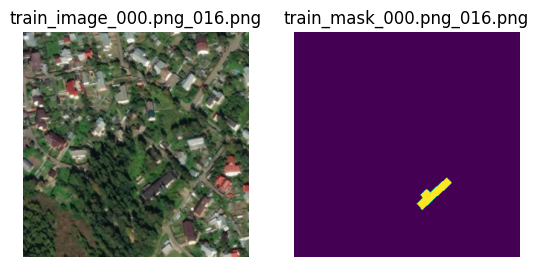

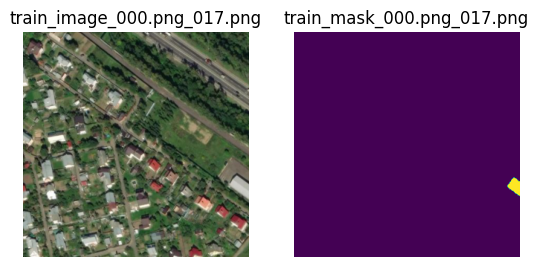

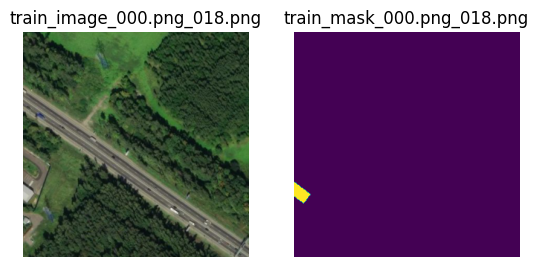

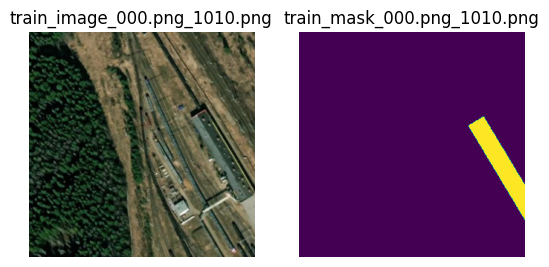

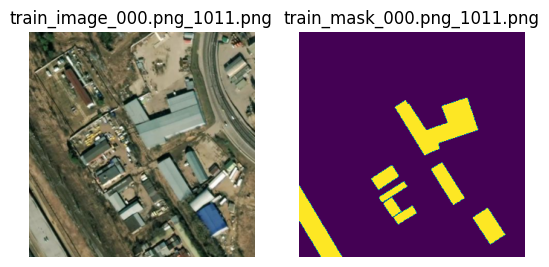

...

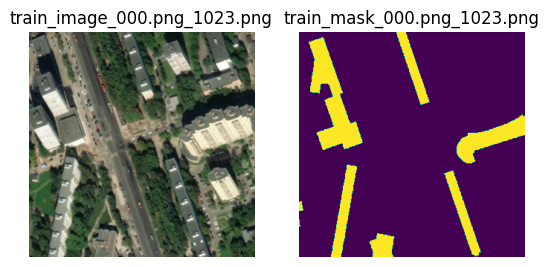

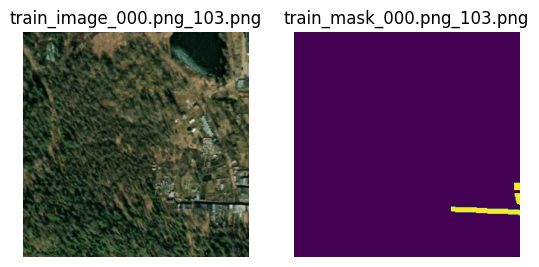

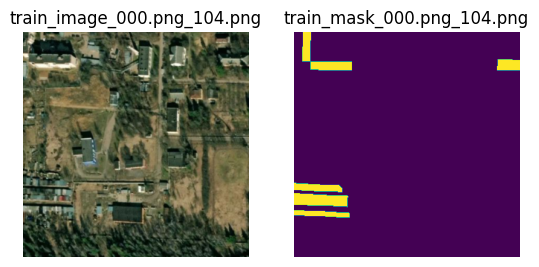

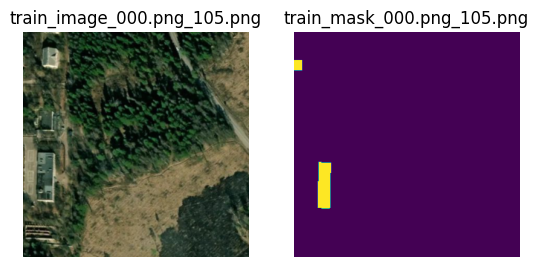

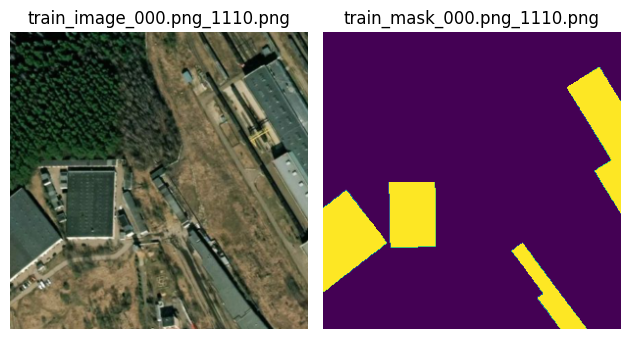

In [23]:
def show_images(imgs_lst,  masks_lst, path_img=ROOTDIR.train, path_mask=ROOTDIR.train_mask, loops=20):
    for i in range(loops):
        fig, axs = plt.subplots(nrows=1, ncols=2)
        img_path = os.path.join(path_img,str(imgs_lst[i]))
        mask_path = os.path.join(path_mask,str(masks_lst[i]))
        img = Image.open(img_path)
        mask = Image.open(mask_path)

        axs[0].imshow(img)
        axs[0].set_title(imgs_lst[i])
        axs[0].axis('off')

        axs[1].imshow(mask)
        axs[1].set_title(masks_lst[i])
        axs[1].axis('off')

    plt.tight_layout()
    plt.show()

show_images(sorted_train_img_lst, sorted_train_mask_lst)

In [38]:
class CFG:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    split_pct = 0.2
    learning_rate = 3e-5
    batch_size = 16
    epochs = 10

In [25]:
seed = 123
np.random.seed(seed)
torch.manual_seed(seed)

In [26]:
CFG.device

device(type='cuda')

In [27]:
permuted_train_img_lst = np.random.permutation(np.array(sorted_train_img_lst))
permuted_train_mask_lst = [x.replace("_image_", "_mask_") for x in permuted_train_img_lst]

In [28]:
train_images_list = permuted_train_img_lst[int(CFG.split_pct*len(sorted_train_img_lst)) :]
train_masks_list = permuted_train_mask_lst[int(CFG.split_pct*len(sorted_train_mask_lst)) :]
print(len(train_masks_list))

val_images_list = permuted_train_img_lst[: int(CFG.split_pct*len(sorted_train_img_lst))]
val_masks_list = permuted_train_mask_lst[: int(CFG.split_pct*len(sorted_train_mask_lst))]
print(len(val_masks_list))

4256
1063


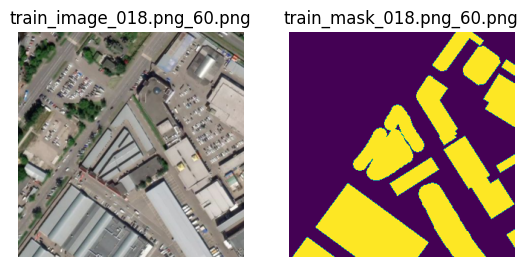

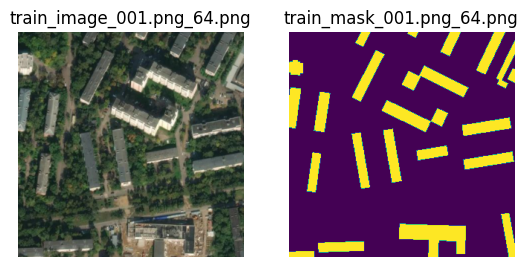

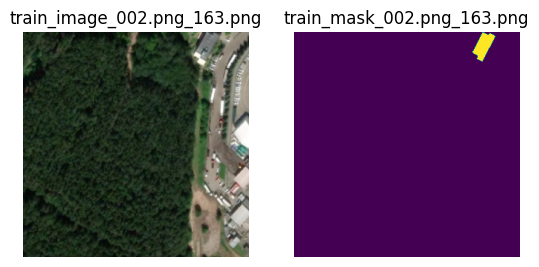

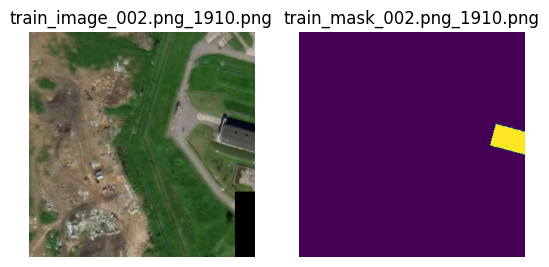

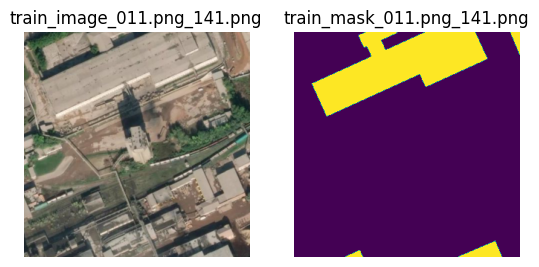

...

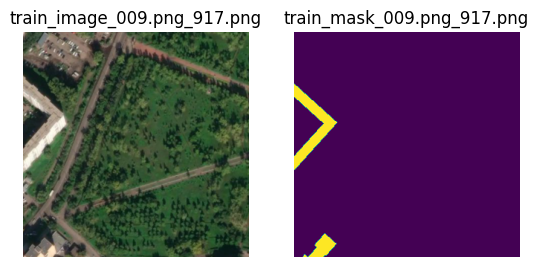

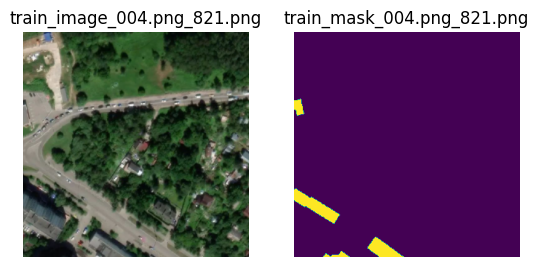

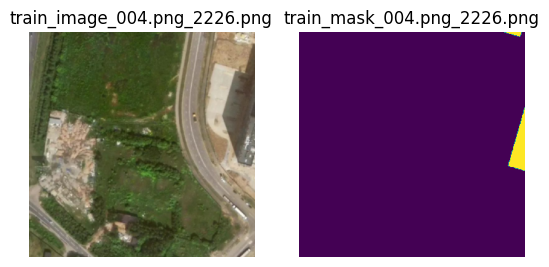

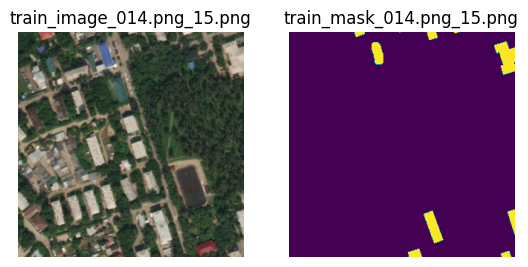

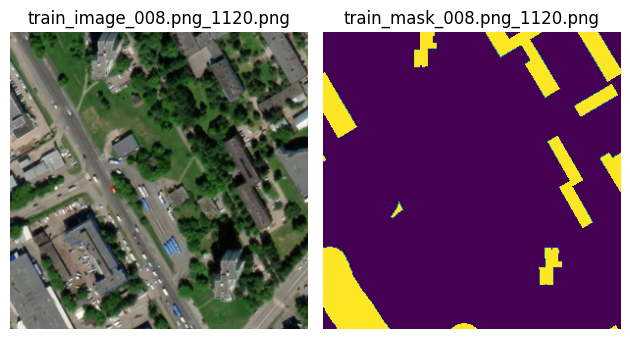

In [29]:
show_images(train_images_list,train_masks_list)

In [56]:
class BuildDataset(Dataset):
    def __init__(self,img_list,mask_list, path_img=ROOTDIR.train, path_mask=ROOTDIR.train_mask, transform=None):
        self.img_list = img_list
        self.mask_list = mask_list
        self.path_img = path_img
        self.path_mask = path_mask
        self.transform = transform

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self,index):
        img_path = os.path.join(self.path_img,self.img_list[index])
        mask_path = os.path.join(self.path_mask,self.mask_list[index])
        img = Image.open(img_path)
        mask = Image.open(mask_path)
        img = np.array(img)
        mask = np.array(mask)
        mask[mask==255.0] = 1.0


        if self.transform:
            augmentation = self.transform(image=img, mask=mask)
            img = augmentation["image"]
            mask = augmentation["mask"]
            mask = torch.unsqueeze(mask,0)


        return img,mask

In [31]:
train_transform = A.Compose([
                             A.Rotate(limit=15,p=0.1),
                             A.HorizontalFlip(p=0.5),
                             A.Normalize(mean=(0,0,0),std=(1,1,1),max_pixel_value=255),
                             ToTensorV2()])

val_transform = A.Compose([
                           A.Normalize(mean=(0,0,0),std=(1,1,1),max_pixel_value=255),
                           ToTensorV2()])

In [32]:
train_dataset = BuildDataset(train_images_list, train_masks_list, transform = train_transform)
val_dataset = BuildDataset(val_images_list, val_masks_list, transform = train_transform)

In [33]:
idx = 200
img,mask = train_dataset[idx]

In [34]:
print(mask.shape)
print(img.max())
len(train_dataset)

torch.Size([1, 304, 304])
tensor(0.9961)


4256

In [35]:
train_dataloader = DataLoader(train_dataset,batch_size=CFG.batch_size,shuffle=True,drop_last=True)
val_dataloader = DataLoader(val_dataset,batch_size=CFG.batch_size,shuffle=False,drop_last=True)

In [36]:
a = iter(train_dataloader)
img,mask = next(a)
print(img.shape,mask.shape)

torch.Size([8, 3, 304, 304]) torch.Size([8, 1, 304, 304])


In [37]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null
import segmentation_models_pytorch as smp
import segmentation_models_pytorch.utils.metrics

In [39]:
ENCODER = 'resnet101'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid'

# create segmentation model with pretrained encoder
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    classes=1,
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:00<00:00, 236MB/s]


In [40]:
TRAINING = True

# Set num of epochs
EPOCHS = 30

# Set device: `cuda` or `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# define loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.Fscore(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.0001),
])

# define learning rate scheduler (not used in this NB)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

# load best saved model checkpoint from previous commit (if present)
if os.path.exists('../input/deeplabv3-efficientnetb4-frontend-using-pytorch/best_model.pth'):
    model = torch.load('../input/deeplabv3-efficientnetb4-frontend-using-pytorch/best_model.pth', map_location=DEVICE)

In [41]:
train_epoch = smp.utils.train.TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
    verbose=True,
)

In [42]:
%%time

if TRAINING:

    best_f1_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_dataloader)
        valid_logs = valid_epoch.run(val_dataloader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_f1_score < valid_logs['fscore']:
            best_f1_score = valid_logs['fscore']
            torch.save(model, './best_model.pth')
            print('Model saved!')


Epoch: 0
valid: 100%|██████████| 132/132 [00:11<00:00, 11.55it/s, dice_loss - 0.3106, fscore - 0.708]
Model saved!

Epoch: 1
valid: 100%|██████████| 132/132 [00:11<00:00, 11.42it/s, dice_loss - 0.2948, fscore - 0.713]
Model saved!

Epoch: 2
valid: 100%|██████████| 132/132 [00:11<00:00, 11.52it/s, dice_loss - 0.2759, fscore - 0.7292]
Model saved!

Epoch: 3
valid: 100%|██████████| 132/132 [00:11<00:00, 11.53it/s, dice_loss - 0.2659, fscore - 0.7374]
Model saved!

Epoch: 4
valid: 100%|██████████| 132/132 [00:11<00:00, 11.54it/s, dice_loss - 0.2637, fscore - 0.7393]
Model saved!

Epoch: 5
valid: 100%|██████████| 132/132 [00:11<00:00, 11.51it/s, dice_loss - 0.2575, fscore - 0.7449]
Model saved!

Epoch: 6
valid: 100%|██████████| 132/132 [00:11<00:00, 11.62it/s, dice_loss - 0.255, fscore - 0.7477]
Model saved!

Epoch: 7
valid: 100%|██████████| 132/132 [00:11<00:00, 11.63it/s, dice_loss - 0.2548, fscore - 0.7474]

Epoch: 8
valid: 100%|██████████| 132/132 [00:11<00:00, 11.54it/s, dice_loss - 0

In [58]:
if os.path.exists('./best_model.pth'):
    best_model = torch.load('./best_model.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from this run.')

# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('../input//deeplabv3-efficientnetb4-frontend-using-pytorch/best_model.pth'):
    best_model = torch.load('../input//deeplabv3-efficientnetb4-frontend-using-pytorch/best_model.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from a previous commit.')

In [59]:
def visualize(img, mask):
    plt.subplot(1, 2, 1)
    plt.imshow(img,cmap="gray")  # Convert (3, 572, 572) -> (572, 572, 3)
    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap="gray")  # Convert (1, 572, 572) -> (572, 572, 1)
    plt.show()




In [60]:
test_img_lst = os.listdir(ROOTDIR.test)
test_mask_lst = os.listdir(ROOTDIR.test_mask)

In [61]:
sorted_test_mask_lst = sorted(test_mask_lst)
sorted_test_img_lst = sorted(test_img_lst)

In [63]:
test_dataset = BuildDataset(sorted_test_img_lst, sorted_test_mask_lst, path_img=ROOTDIR.test, path_mask=ROOTDIR.test_mask)


NameError: ignored

In [59]:
test_dataloader = DataLoader(test_dataset)

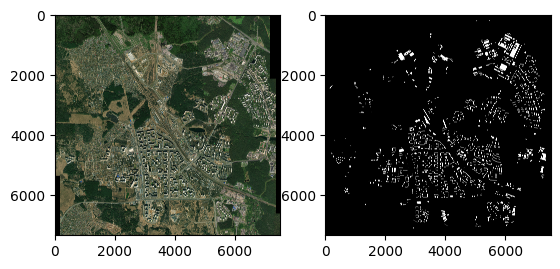

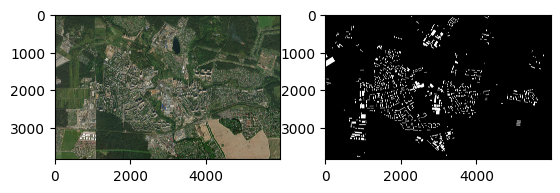

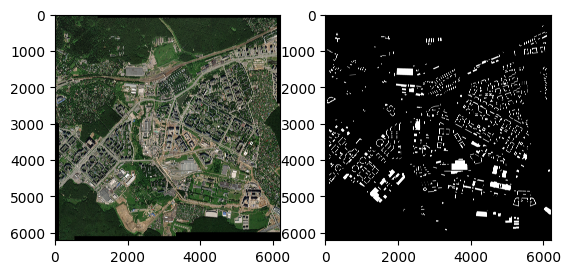

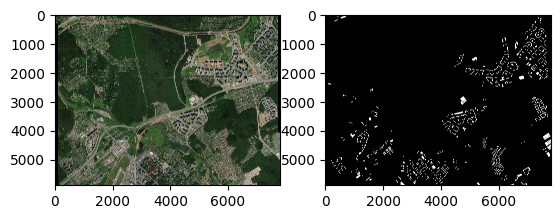

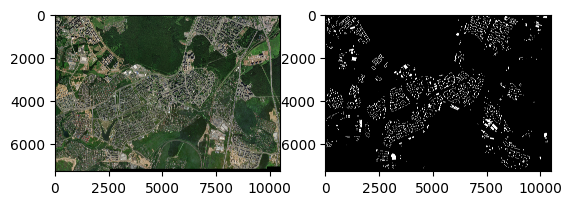

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (99969780 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


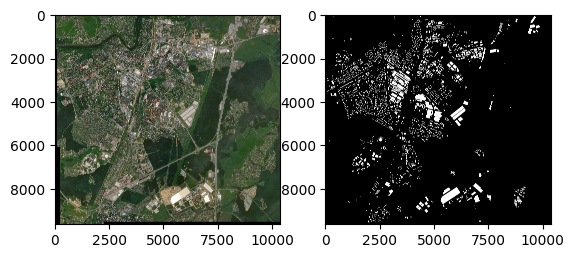

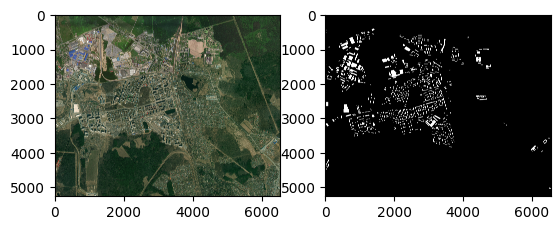

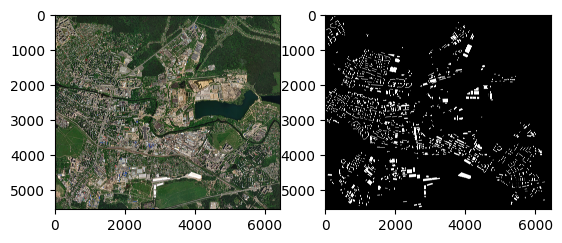

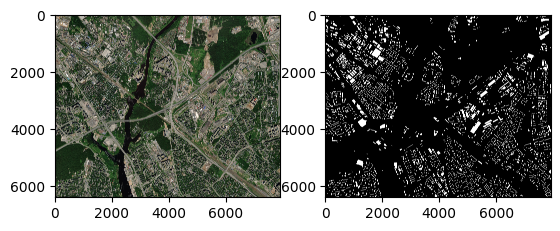

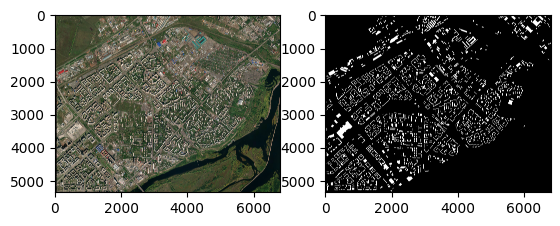

...

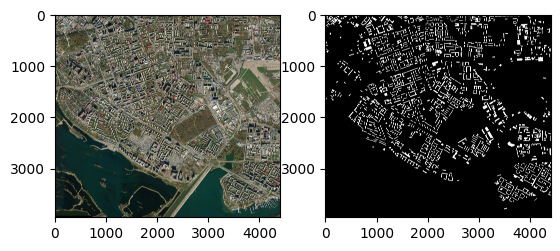

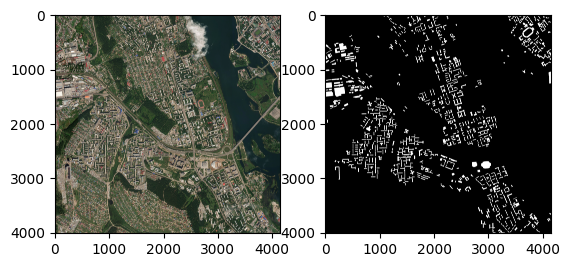

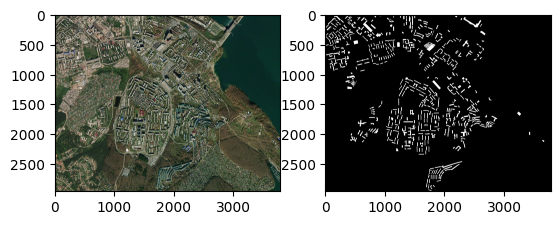

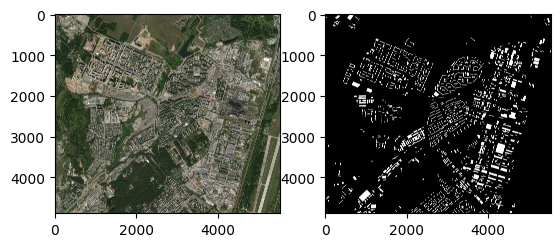

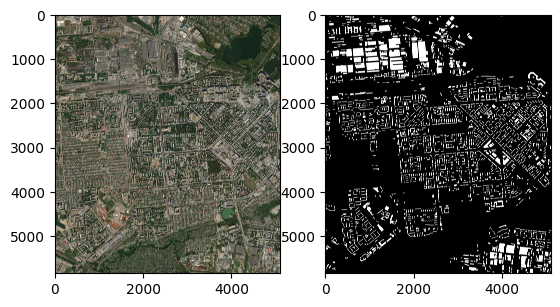

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (108245178 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


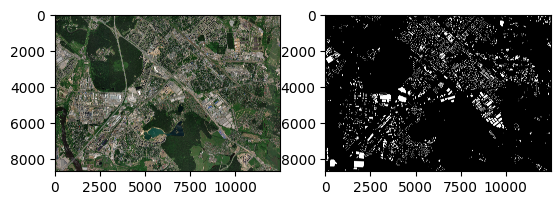

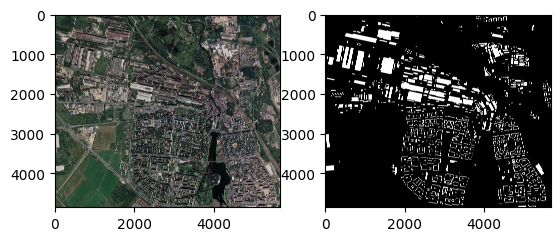

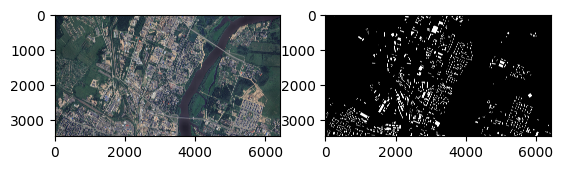

In [70]:
for i in range(1, len(test_dataset)):
  image, mask = test_dataset[i]

  visualize(
    image,
    mask)

In [54]:
%cd ..
%cd ..
os.makedirs('predictions', exist_ok=True)
%cd predictions

/content/predictions


In [57]:
for idx in range(1, len(test_dataset)):

    image, gt_mask = test_dataset[idx]
    print(image.shape)
    patches_img = patchify(np.array(image), (304, 304), step=304)

    for i in range(patches_img.shape[0]):
      for j in range(patches_img.shape[1]):
          single_patch_img = (patches_img[i,j,:,:])
          x_tensor = torch.from_numpy(single_patch_img).to(DEVICE)
    print(x_tensor.shape)
    # Predict test image
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()
    #pred_mask = np.transpose(pred_mask,(1,2,0))

    visualize(
       image,
       pred_mask
    )

NameError: ignored